<a href="https://colab.research.google.com/github/Sergey7OV/CompoZit/blob/main/VKR_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Импортируем все необходимые библиотеки для исследования
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
%matplotlib inline
sns.set_style('darkgrid')

In [ ]:
#Cмонтируем весь Google Disk в Colab:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#Загрузка данных
#Загружаем первый датасет из файла 'X_bp.xlsx'
df_bp = pd.read_excel('/content/gdrive/MyDrive/Colab Notebooks/ВКР/data/X_bp.xlsx')
# Загружаем второй датасет 'X_nup.xlsx'
df_nup = pd.read_excel('/content/gdrive/MyDrive/Colab Notebooks/ВКР/data/X_nup.xlsx')

In [ ]:
#Смотрим данные
df_bp.head().T

In [ ]:
df_nup.head()

In [ ]:
#Изучаем данные
df_bp.describe().T

In [ ]:
df_nup.describe()

In [ ]:
#Делаем объединение данных по индексу - тип объединения INNER
df = pd.merge(df_bp, df_nup, how='inner', on='Unnamed: 0')
df.head().T

,0,1,2,3,4
Unnamed: 0,0.000000,1.000000,2.000000,3.000000,4.000000
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000


In [ ]:
#Удаляем первый столбец
del df['Unnamed: 0']

In [ ]:
#Cмотрим количество колонок и столбцов
df.shape
# Итоговый датасет имеет 13 столбцов и 1023 строки.
# 17 строк из таблицы X_nup были отброшены в процессе сшивки данных

(1023, 13)

In [ ]:
#Изучим статистические характеристики датасета
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [ ]:
#Просмотрим информацию о датасете, проверим тип данных в каждом столбце (типы признаков)
df.info()
#Все переменные, кроме "Угол нашивки, град" содержат значения float64. Переменные "Угол нашивки, град" содержат значения int64.
#Качественные характеристики отсутствуют. Пропусков не имеется. Ни одна из записей не является NaN.
#Таким образом очистка данных не требуется. Объединенный датасет имеет  1023 строки.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [ ]:
#Поиск уникальных значений с помощью функции nunique
df.nunique()
#В столбце "Угол нашивки, град" всего 2 значения.

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [ ]:
#Так как кол-во уникальных значений в колонке "Угол нашивки, град" равно 2, можем привести данные в этой колонке к значениям 0 и 1 c помощью метода LabelEncoder
labelencoder = LabelEncoder()
df['Угол нашивки'] = labelencoder.fit_transform(df['Угол нашивки, град'])
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Угол нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,0


In [ ]:
#Удаляем лишний столбец 'Угол нашивки, град' 
del df['Угол нашивки, град']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Шаг нашивки                           1023 non-null   float64
 11  Плотность нашивки

In [ ]:
# Проверим датасет на дубликаты
df.duplicated().sum()
#Дубликатов нет

0

In [ ]:
# Выведем средние значения
df.mean()

Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
Угол нашивки                               0.491691
dtype: float64

In [ ]:
#Выведем медианные значения
df.median()

Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температура вспышки, С_2                 285.896812
Поверхностная плотность, г/м2            451.864365
Модуль упругости при растяжении, ГПа      73.268805
Прочность при растяжении, МПа           2459.524526
Потребление смолы, г/м2                  219.198882
Шаг нашивки                                6.916144
Плотность нашивки                         57.341920
Угол нашивки                               0.000000
dtype: float64

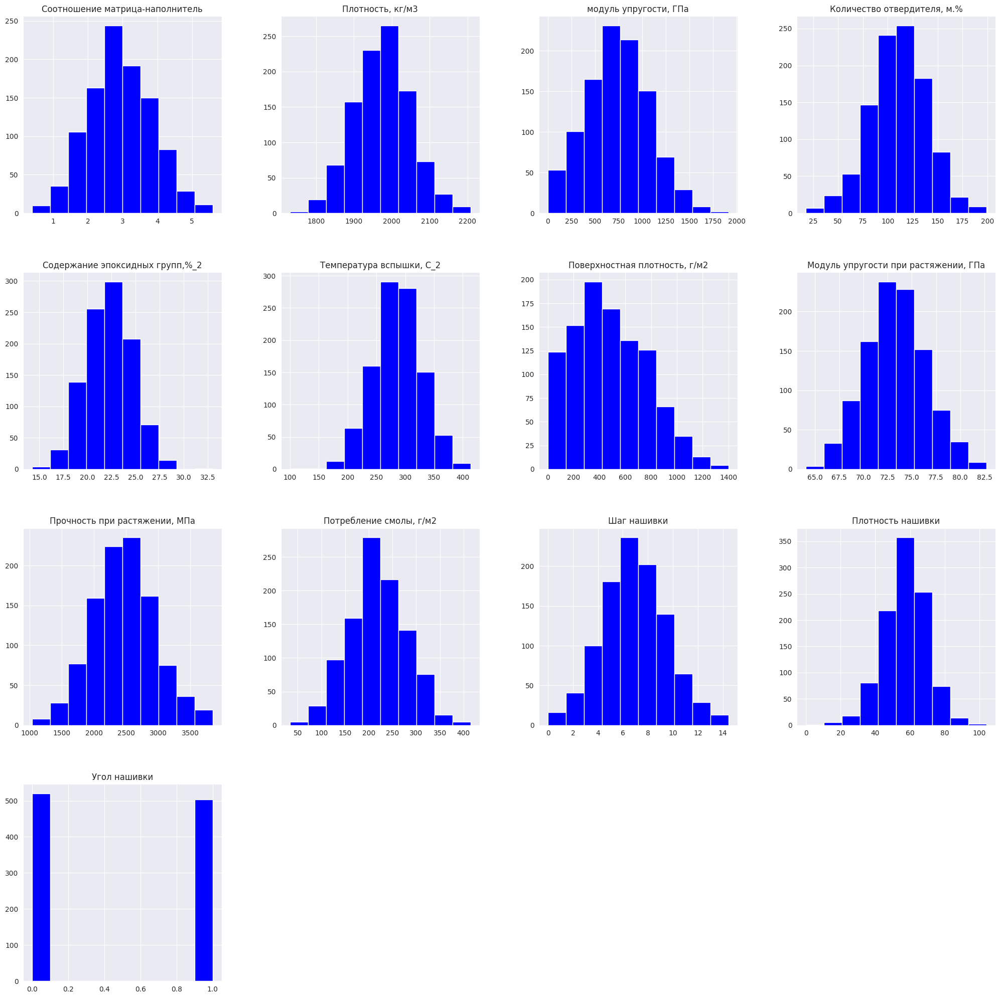

In [ ]:
# Построим гистограммы распределения каждой из переменных без нормализации и исключения выбросов
df.hist(figsize = (25,25), color = "b")
plt.show()

In [ ]:
#Создадим переменную для названия всех столбцов. 
column_names = df.columns


<function matplotlib.pyplot.show(close=None, block=None)>

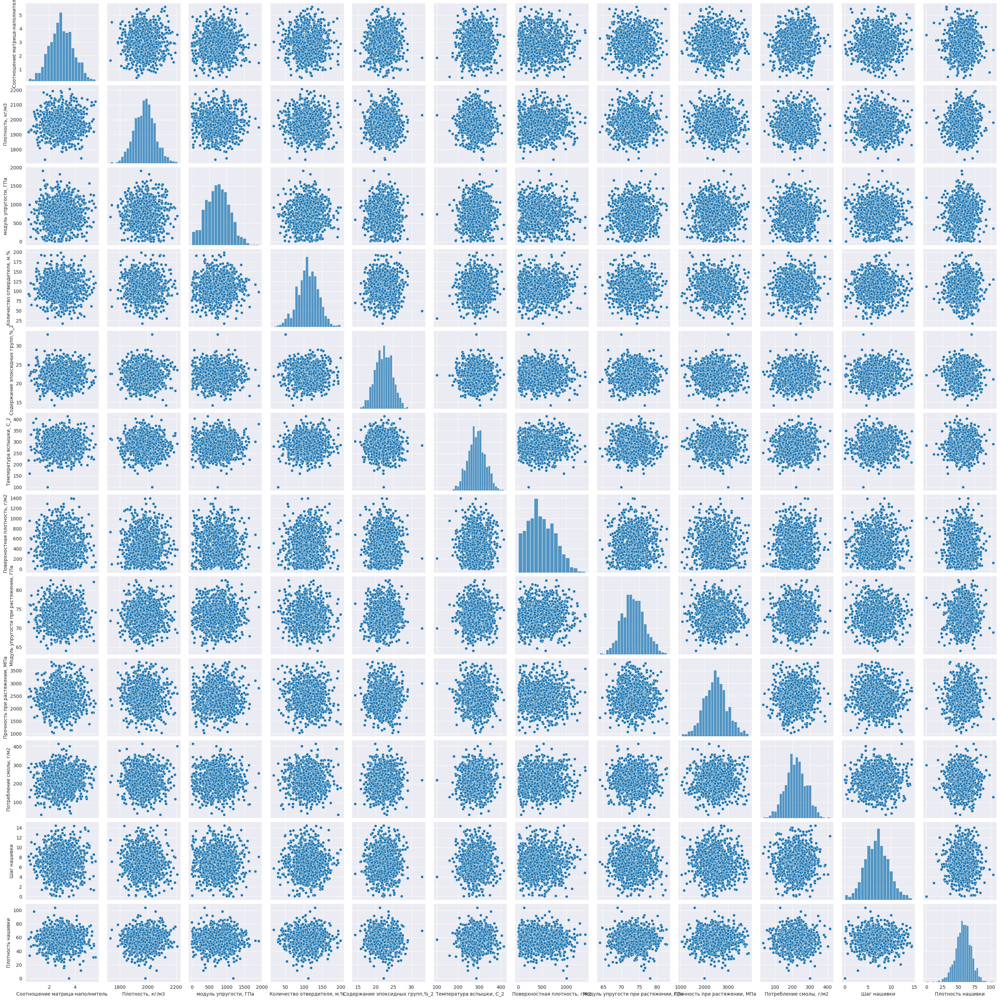

In [ ]:
#Нарисуем попарные графики рассеяния точек
sns.pairplot(df[column_names])
plt.show

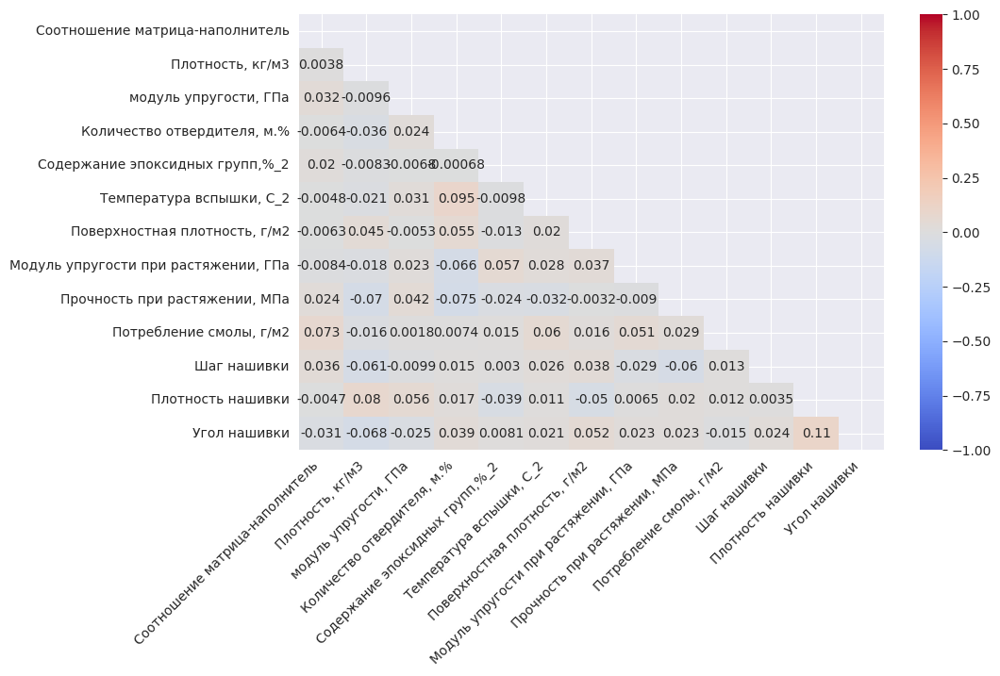

In [ ]:
# Матрица корреляции
correlation_matrix = np.triu(df.corr())
# Выводим признаки на тепловую карту
plt.figure(figsize= (10, 6))
sns.heatmap(df.corr(), annot = True, vmax = 1, vmin = -1, cmap='coolwarm', mask = correlation_matrix)
plt.xticks(rotation=45, ha='right')
plt.show()

Вывод: максимальная корреляция между Плотностью нашивки и углом нашивки и составляет 0.11, что говорит об отсутствии зависимости между этими данными. Корреляция между всеми параметрами очень близка к 0, что говорит об отсутствии корреляционных связей между переменными.

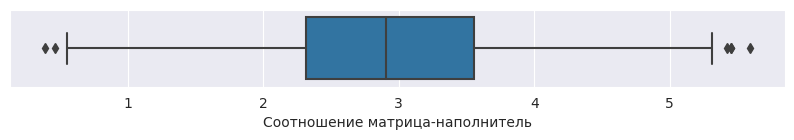

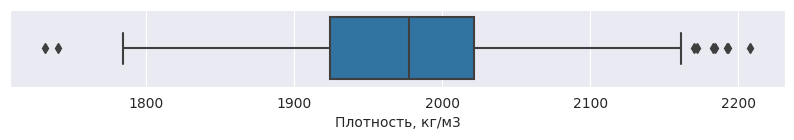

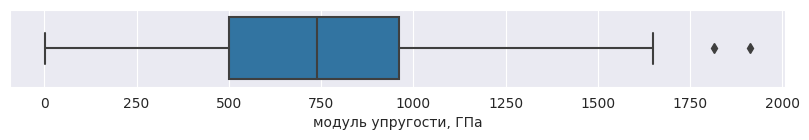

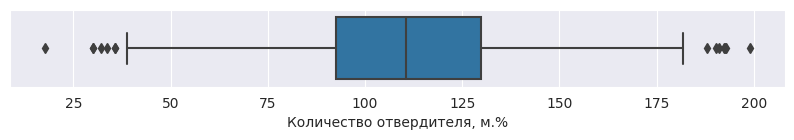

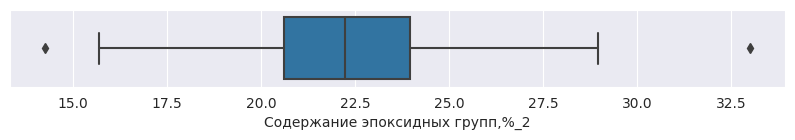

...

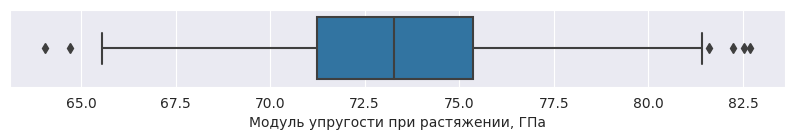

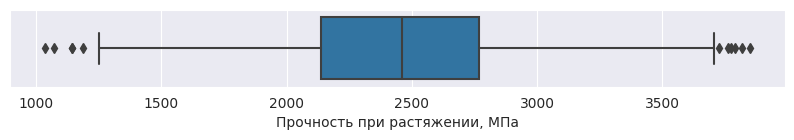

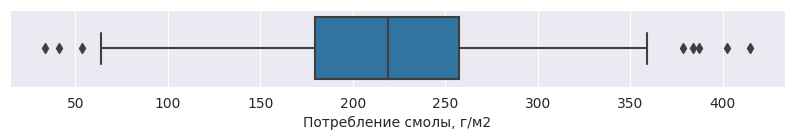

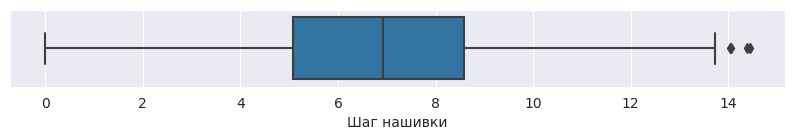

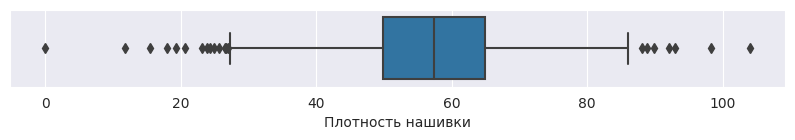

In [ ]:
# Поиск аномалий и выбросов
#Визулизация данных с помощью boxplot
for col in df.columns:
  plt.figure(figsize=(10,1))
  sns.boxplot(x=df[col])
  plt.show()

In [ ]:
#Поиск уникальных значений с помощью функции nunique
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [ ]:
#Для очистки данных создадим копию датасета
df_clean = df.copy()

In [ ]:
#Определим количество выбросов с помощью квартильного анализа
# Вычисляем квартили и межквартильный диапазон для всех столбцов
q1 = df_clean.quantile(0.25)
q3 = df_clean.quantile(0.75)
iqr = q3 - q1

# Вычисляем нижнюю и верхнюю границы для всех столбцов
lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr

# Находим выбросы для всех столбцов
outliers = (df_clean < lower_bound) | (df_clean > upper_bound)

# Считаем количество выбросов в каждом столбце
print(outliers.sum())

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Шаг нашивки                              4
Плотность нашивки                       21
Угол нашивки                             0
dtype: int64


In [ ]:
#Выведем значения индексов выбросов
for col in outliers.columns:
  print(col, outliers.index [outliers[col] > 0].tolist())

Соотношение матрица-наполнитель [237, 284, 378, 505, 673, 877]
Плотность, кг/м3 [100, 224, 251, 264, 317, 499, 626, 873, 918]
модуль упругости, ГПа [592, 770]
Количество отвердителя, м.% [0, 94, 208, 257, 412, 448, 495, 503, 511, 535, 800, 819, 867, 958]
Содержание эпоксидных групп,%_2 [2, 298]
Температура вспышки, С_2 [0, 175, 322, 378, 649, 721, 791, 938]
Поверхностная плотность, г/м2 [692, 718]
Модуль упругости при растяжении, ГПа [52, 135, 375, 505, 636, 1000]
Прочность при растяжении, МПа [99, 106, 172, 185, 262, 270, 318, 387, 695, 719, 858]
Потребление смолы, г/м2 [100, 119, 211, 471, 503, 593, 787, 800]
Шаг нашивки [114, 392, 446, 529]
Плотность нашивки [19, 41, 74, 117, 140, 165, 193, 233, 279, 309, 348, 369, 383, 438, 461, 464, 465, 466, 481, 496, 508]
Угол нашивки []


In [ ]:
#Удаляем выбросы
df_clean = df_clean[~outliers.any(axis=1)]
df_clean.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Шаг нашивки                             0
Плотность нашивки                       0
Угол нашивки                            0
dtype: int64

In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Шаг нашивки                           936 non-null    float64
 11  Плотность нашивки 

In [ ]:
#Вторая проверка на выбросы
q1 = df_clean.quantile(0.25)
q3 = df_clean.quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr
outliers = (df_clean < lower_bound) | (df_clean > upper_bound)
outliers_count = outliers.sum()
print(outliers_count)


Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   1
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    1
Прочность при растяжении, МПа           4
Потребление смолы, г/м2                 1
Шаг нашивки                             0
Плотность нашивки                       3
Угол нашивки                            0
dtype: int64


In [ ]:
#Второй раз удаляем выбросы
df_clean = df_clean[~outliers.any(axis=1)]
df_clean.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Шаг нашивки                             0
Плотность нашивки                       0
Угол нашивки                            0
dtype: int64

In [ ]:
#Выведем значения индексов выбросов
for col in outliers.columns:
  print(col, outliers.index [outliers[col] > 0].tolist())

Соотношение матрица-наполнитель []
Плотность, кг/м3 []
модуль упругости, ГПа [741]
Количество отвердителя, м.% []
Содержание эпоксидных групп,%_2 []
Температура вспышки, С_2 []
Поверхностная плотность, г/м2 []
Модуль упругости при растяжении, ГПа [706]
Прочность при растяжении, МПа [24, 654, 897, 1008]
Потребление смолы, г/м2 [541]
Шаг нашивки []
Плотность нашивки [261, 389, 426]
Угол нашивки []


In [ ]:
#Третья проверка на выбросы
q1 = df_clean.quantile(0.25)
q3 = df_clean.quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr
outliers = (df_clean < lower_bound) | (df_clean > upper_bound)
outliers_count = outliers.sum()
print(outliers_count)

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           2
Потребление смолы, г/м2                 1
Шаг нашивки                             0
Плотность нашивки                       1
Угол нашивки                            0
dtype: int64


In [ ]:
#Третий раз удаляем выбросы
df_clean = df_clean[~outliers.any(axis=1)]
df_clean.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Шаг нашивки                             0
Плотность нашивки                       0
Угол нашивки                            0
dtype: int64

In [ ]:
#Четвертая проверка на выбросы
q1 = df_clean.quantile(0.25)
q3 = df_clean.quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr
outliers = (df_clean < lower_bound) | (df_clean > upper_bound)
outliers_count = outliers.sum()
print(outliers_count)

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Шаг нашивки                             0
Плотность нашивки                       0
Угол нашивки                            0
dtype: int64


Вывод: данные очищены

In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Шаг нашивки                           922 non-null    float64
 11  Плотность нашивки 

В датасете осталось 922 записи

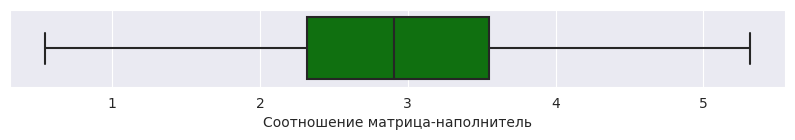

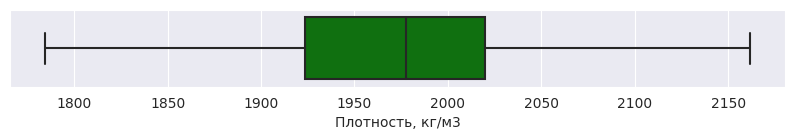

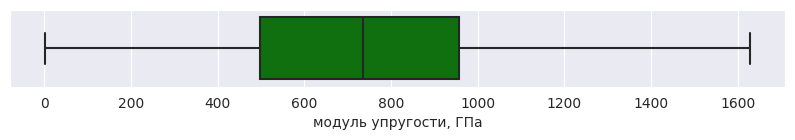

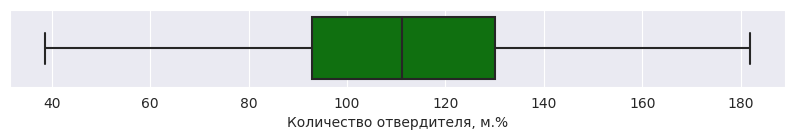

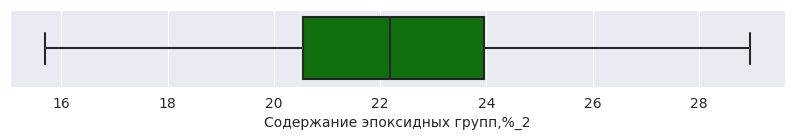

...

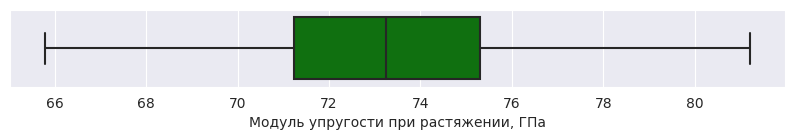

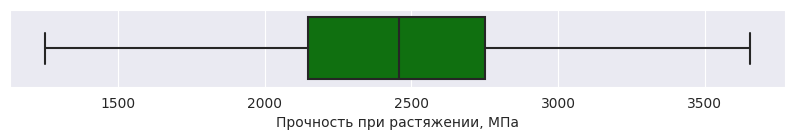

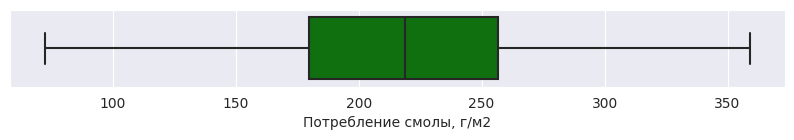

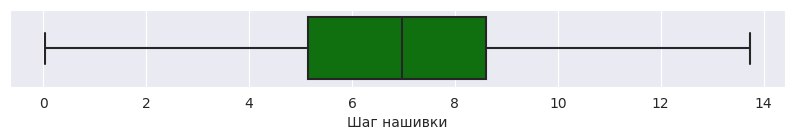

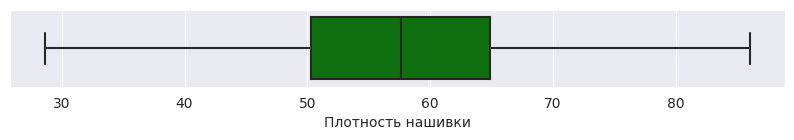

In [ ]:
#Визулизация чистых данных с помощью boxplot
for col in df_clean.columns:
  plt.figure(figsize=(10,1),  )
  sns.boxplot(x=df_clean[col], color = 'g')
  plt.show()

In [ ]:
# Очистка выбросов методом Z score
from scipy import stats
df_clean_z = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)].copy()
df_clean_z.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       999 non-null    float64
 1   Плотность, кг/м3                      999 non-null    float64
 2   модуль упругости, ГПа                 999 non-null    float64
 3   Количество отвердителя, м.%           999 non-null    float64
 4   Содержание эпоксидных групп,%_2       999 non-null    float64
 5   Температура вспышки, С_2              999 non-null    float64
 6   Поверхностная плотность, г/м2         999 non-null    float64
 7   Модуль упругости при растяжении, ГПа  999 non-null    float64
 8   Прочность при растяжении, МПа         999 non-null    float64
 9   Потребление смолы, г/м2               999 non-null    float64
 10  Шаг нашивки                           999 non-null    float64
 11  Плотность нашивки 

In [ ]:
#Выведем значения несоответствующие Z core
df[(np.abs(stats.zscore(df)) > 3).any(axis = 1)].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24 entries, 0 to 918
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       24 non-null     float64
 1   Плотность, кг/м3                      24 non-null     float64
 2   модуль упругости, ГПа                 24 non-null     float64
 3   Количество отвердителя, м.%           24 non-null     float64
 4   Содержание эпоксидных групп,%_2       24 non-null     float64
 5   Температура вспышки, С_2              24 non-null     float64
 6   Поверхностная плотность, г/м2         24 non-null     float64
 7   Модуль упругости при растяжении, ГПа  24 non-null     float64
 8   Прочность при растяжении, МПа         24 non-null     float64
 9   Потребление смолы, г/м2               24 non-null     float64
 10  Шаг нашивки                           24 non-null     float64
 11  Плотность нашивки   

In [ ]:
#Визулизация ощищенных данных Z core с помощью boxplot
for col in column_names:
  df_clean_z.boxplot(column=[col])
  plt.show()

In [ ]:
# Очистка выбросов методом Z score второй раз
from scipy import stats
df_clean_z = df_clean_z[(np.abs(stats.zscore(df)) < 3).all(axis=1)]
df_clean_z.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       999 non-null    float64
 1   Плотность, кг/м3                      999 non-null    float64
 2   модуль упругости, ГПа                 999 non-null    float64
 3   Количество отвердителя, м.%           999 non-null    float64
 4   Содержание эпоксидных групп,%_2       999 non-null    float64
 5   Температура вспышки, С_2              999 non-null    float64
 6   Поверхностная плотность, г/м2         999 non-null    float64
 7   Модуль упругости при растяжении, ГПа  999 non-null    float64
 8   Прочность при растяжении, МПа         999 non-null    float64
 9   Потребление смолы, г/м2               999 non-null    float64
 10  Шаг нашивки                           999 non-null    float64
 11  Плотность нашивки 

<ipython-input-52-4dc8a52dece5>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_clean_z = df_clean_z[(np.abs(stats.zscore(df)) < 3).all(axis=1)]


In [ ]:
#Выведем значения несоответствующие Z core
df_clean_z[(np.abs(stats.zscore(df)) >= 3).any(axis = 1)].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       0 non-null      float64
 1   Плотность, кг/м3                      0 non-null      float64
 2   модуль упругости, ГПа                 0 non-null      float64
 3   Количество отвердителя, м.%           0 non-null      float64
 4   Содержание эпоксидных групп,%_2       0 non-null      float64
 5   Температура вспышки, С_2              0 non-null      float64
 6   Поверхностная плотность, г/м2         0 non-null      float64
 7   Модуль упругости при растяжении, ГПа  0 non-null      float64
 8   Прочность при растяжении, МПа         0 non-null      float64
 9   Потребление смолы, г/м2               0 non-null      float64
 10  Шаг нашивки                           0 non-null      float64
 11  Плотность нашивки              

<ipython-input-82-002b04d99884>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_clean_z[(np.abs(stats.zscore(df)) >= 3).any(axis = 1)].info()


<Axes: ylabel='Density'>

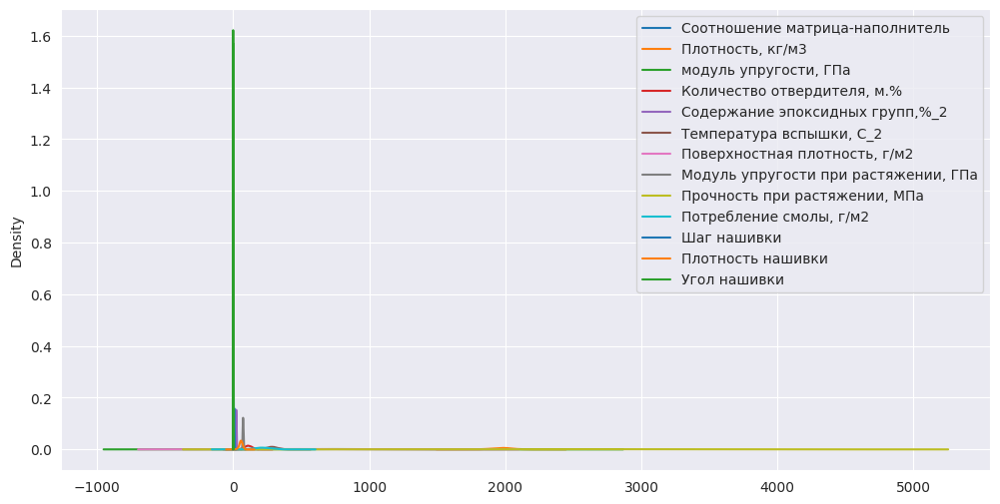

In [ ]:
# Оценка плотности ядра датасета показывает, что наши данные находятся в разных диапазонах. 
#Так как диапазоны очень разные, данные нужно нормализовать.
fig, ax = plt.subplots(figsize = (12, 6))
df.plot(kind = 'kde', ax = ax)

In [ ]:
#Нормализуем значения датасета с помощью метода MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(df_clean), columns = df_clean.columns, index=df_clean.index)
df_norm.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,922.0,0.499412,0.187858,0.0,0.371909,0.495189,0.629774,1.0
"Плотность, кг/м3",922.0,0.502904,0.188395,0.0,0.368184,0.511396,0.624719,1.0
"модуль упругости, ГПа",922.0,0.451341,0.201534,0.0,0.305188,0.451377,0.587193,1.0
"Количество отвердителя, м.%",922.0,0.506200,0.186876,0.0,0.378514,0.506382,0.638735,1.0
"Содержание эпоксидных групп,%_2",922.0,0.490578,0.180548,0.0,0.366571,0.488852,0.623046,1.0
"Температура вспышки, С_2",922.0,0.516739,0.190721,0.0,0.386228,0.516931,0.646553,1.0
"Поверхностная плотность, г/м2",922.0,0.373295,0.217269,0.0,0.204335,0.354161,0.538397,1.0
"Модуль упругости при растяжении, ГПа",922.0,0.487343,0.196366,0.0,0.353512,0.483718,0.617568,1.0
"Прочность при растяжении, МПа",922.0,0.503776,0.188668,0.0,0.373447,0.501481,0.624299,1.0
"Потребление смолы, г/м2",922.0,0.507876,0.199418,0.0,0.374647,0.510143,0.642511,1.0


<Axes: ylabel='Density'>

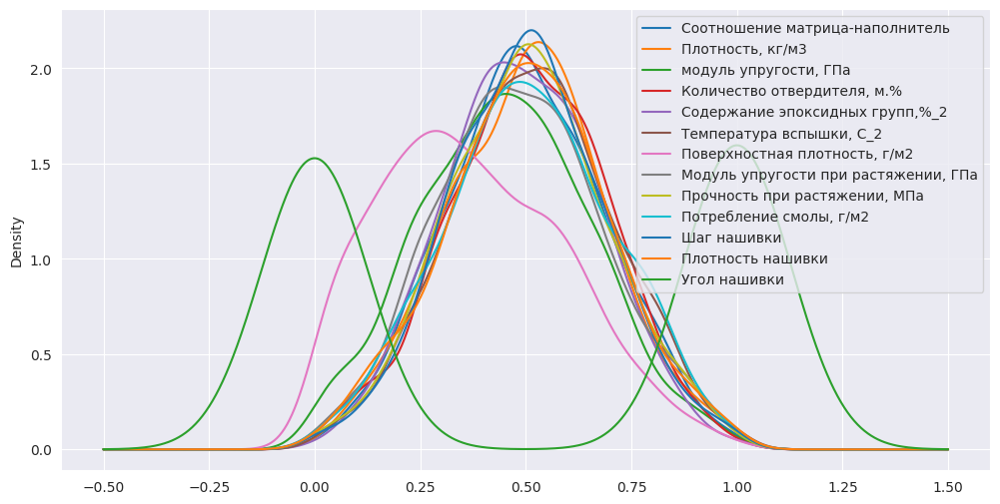

In [ ]:
#Выведем распределение нормализованных данных
fig, ax = plt.subplots(figsize = (12, 6))
df_norm.plot(kind = 'kde', ax = ax)

<function matplotlib.pyplot.show(close=None, block=None)>

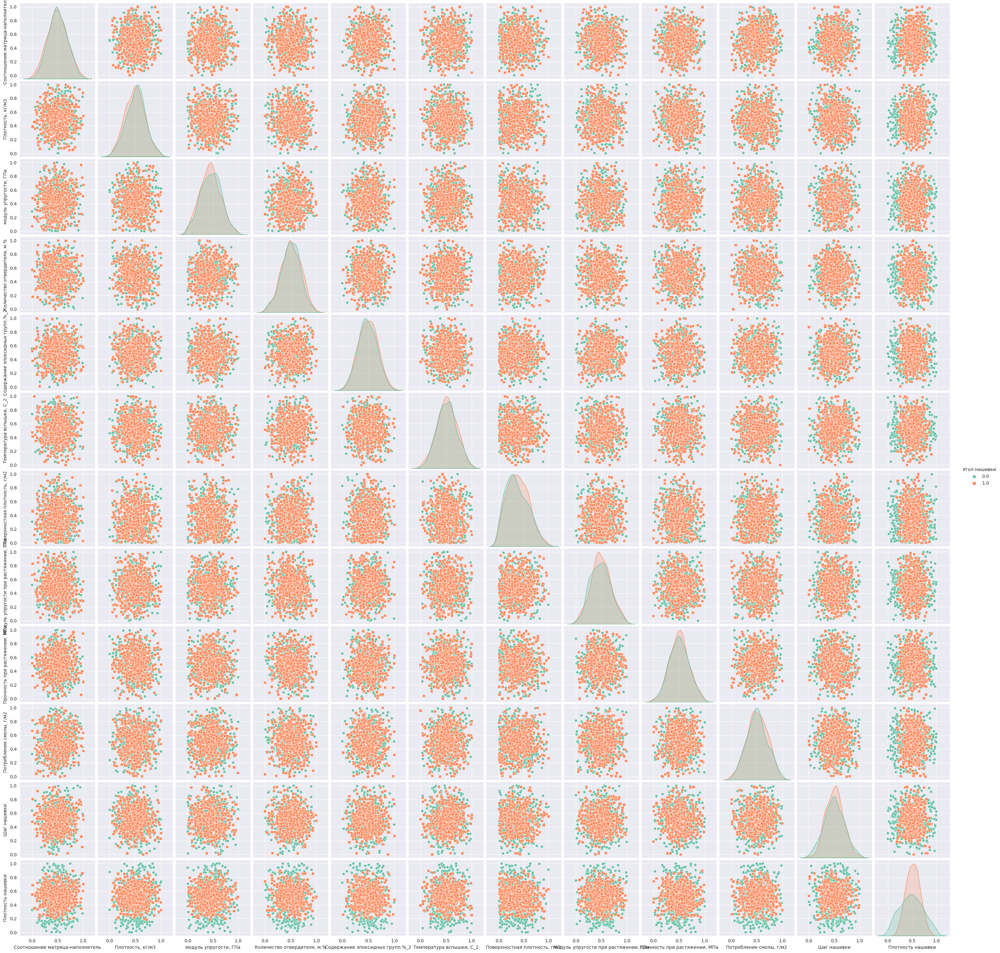

In [ ]:
#Нарисуем попарные графики рассеяния точек для нормализованного графика
sns.pairplot(df_norm, hue = 'Угол нашивки', markers=["o", "s"], diag_kind= 'auto', palette='Set2')
plt.show

In [ ]:
# Матрица корреляции
correlation_matrix = df_norm.corr()
# Выводим признаки на тепловую карту
plt.figure(figsize= (10, 6))
sns.heatmap(correlation_matrix, annot = True, cmap='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
#Сохраним очищенные и нормализованные данные в файл "X_sum_norm.xlsx"
df_norm.to_excel("/content/gdrive/MyDrive/Colab Notebooks/ВКР/data/X_sum_norm.xlsx")

In [ ]:
#Загружаем объединенный, очищенный и нормализорванный датасет
df_norm = pd.read_excel('/content/gdrive/MyDrive/Colab Notebooks/ВКР/data/X_sum_norm.xlsx')
#Удаляем лишний столбец
df_norm = df_norm.drop(columns='Unnamed: 0')